# Zero-shot object detection

Traditionally, models used for object detection require labeled image datasets for training, and are limited to detecting the set of classes from the training data.

Zero-shot object detection is supported by the **OWL-ViT model (Google, 2022)** which uses a different approach. **OWL-ViT is an open-vocabulary object detector**. It means that it can detect objects in images based on free-text queries without the need to fine-tune the model on labeled datasets.

OWL-ViT leverages multi-modal representations to perform open-vocabulary detection. It **combines CLIP with a general object detector**. Open-vocabulary detection is achieved by embedding free-text queries with the text encoder of CLIP and using them as input to the object classification part:


With this approach, the model can detect objects based on textual descriptions without prior training on labeled datasets:

![image](images/zs.png)


References:
 * Base OWL-ViT model on Huggingface: https://huggingface.co/google/owlvit-base-patch32
 * Article: https://arxiv.org/abs/2205.06230


As usual, in huggingface there are different sizes and versions of the OWL-ViT architecture for zero-shot object detection. You can check all the compatible models here: https://huggingface.co/models?pipeline_tag=zero-shot-object-detection

### Use cases

Zero-shot object detection models can be used in any object detection application where the detection involves text queries for objects of interest.


#### Object Search

Zero-shot object detection models can be used in image search. Smartphones, for example, use zero-shot object detection models to detect entities (such as specific places or objects) and allow the user to search for the entity on the internet.


#### Object Counting

Zero-shot object detection models are used to count instances of objects in a given image. This can include counting the objects in warehouses or stores or the number of visitors in a store. They are also used to manage crowds at events to prevent disasters.


#### Object Tracking

Zero-shot object detectors can track objects in videos.

## Using it from Python

The simplest way to try out inference with OWL-ViT is to use it in a `pipeline()`. Instantiate a pipeline for zero-shot object detection 

In [19]:
from transformers import pipeline

In [20]:
model_name = "google/owlvit-base-patch32"
detector = pipeline(model=model_name, task="zero-shot-object-detection")

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


Next, choose an image you’d like to detect objects in. Here we’ll use the image of astronaut Eileen Collins that is a part of the NASA Great Images dataset.

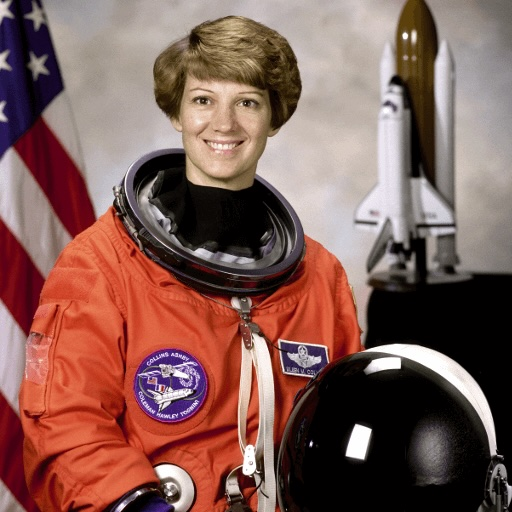

In [21]:
from PIL import Image
import requests

image = Image.open('images/astro.jpg')
image

Pass the image and the candidate object labels to look for to the pipeline. Here we pass the image directly; other suitable options include a local path to an image or an image url. We also pass text descriptions for all items we want to query the image for.

In [22]:
predictions = detector(
    image,
    candidate_labels=["human face", "rocket", "nasa badge", "star-spangled banner"],
)
predictions

[{'score': 0.34625643491744995,
  'label': 'human face',
  'box': {'xmin': 179, 'ymin': 72, 'xmax': 270, 'ymax': 178}},
 {'score': 0.24999374151229858,
  'label': 'nasa badge',
  'box': {'xmin': 132, 'ymin': 343, 'xmax': 209, 'ymax': 424}},
 {'score': 0.1938963234424591,
  'label': 'rocket',
  'box': {'xmin': 350, 'ymin': 0, 'xmax': 469, 'ymax': 288}},
 {'score': 0.13655103743076324,
  'label': 'star-spangled banner',
  'box': {'xmin': 1, 'ymin': 0, 'xmax': 105, 'ymax': 509}},
 {'score': 0.12111852318048477,
  'label': 'nasa badge',
  'box': {'xmin': 277, 'ymin': 339, 'xmax': 327, 'ymax': 380}}]

Let’s visualize the predictions:

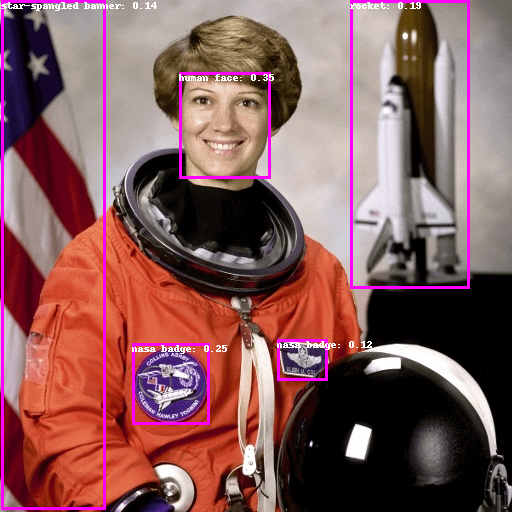

In [23]:
from PIL import ImageDraw

def build_image_with_predictions(image, predictions):

    draw = ImageDraw.Draw(image)

    for prediction in predictions:
        box = prediction["box"]
        label = prediction["label"]
        score = prediction["score"]

        xmin, ymin, xmax, ymax = box.values()
        draw.rectangle(xy=(xmin, ymin, xmax, ymax), outline="magenta", width=3)
        draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

    return image

build_image_with_predictions(image, predictions)

Of course, we can easily change the labels to detect other objects.

In [24]:
image = Image.open('images/astro.jpg')
predictions = detector(
    image,
    candidate_labels=["human eye", "helmet",],
)
predictions

[{'score': 0.134079247713089,
  'label': 'human eye',
  'box': {'xmin': 189, 'ymin': 92, 'xmax': 215, 'ymax': 108}},
 {'score': 0.13324084877967834,
  'label': 'human eye',
  'box': {'xmin': 234, 'ymin': 94, 'xmax': 260, 'ymax': 110}},
 {'score': 0.12515266239643097,
  'label': 'helmet',
  'box': {'xmin': 270, 'ymin': 339, 'xmax': 508, 'ymax': 513}}]

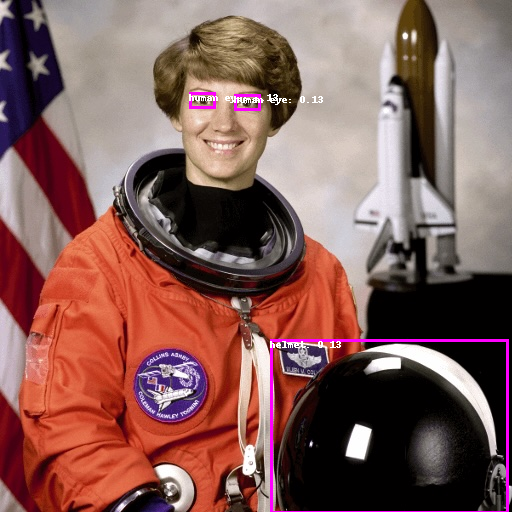

In [25]:
build_image_with_predictions(image, predictions)

Testing with another image...

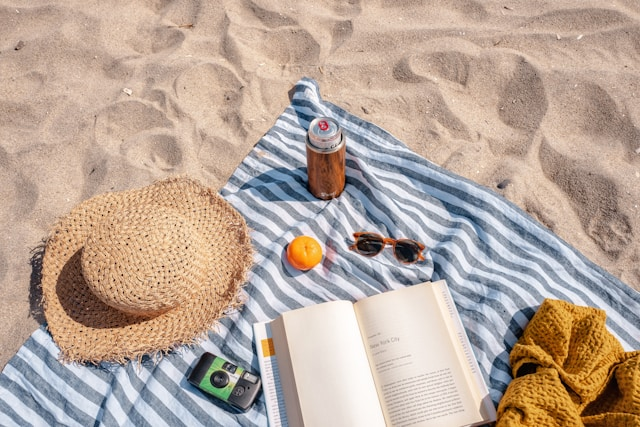

In [26]:
import requests

url = "https://unsplash.com/photos/oj0zeY2Ltk4/download?ixid=MnwxMjA3fDB8MXxzZWFyY2h8MTR8fHBpY25pY3xlbnwwfHx8fDE2Nzc0OTE1NDk&force=true&w=640"
im = Image.open(requests.get(url, stream=True).raw)
im

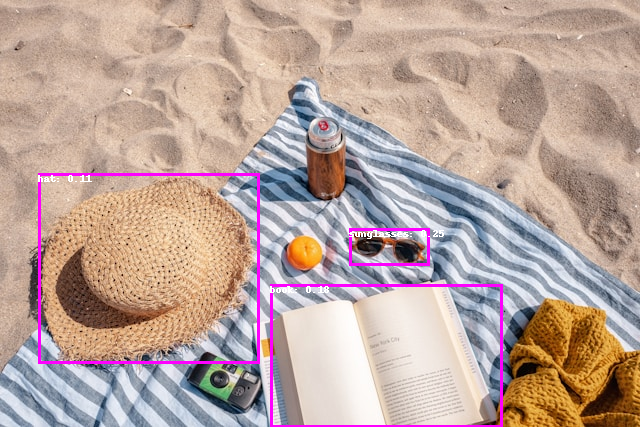

In [27]:
predictions = detector(
    im,
    candidate_labels=["hat", "book", "sunglasses", "camera"],
)
predictions

build_image_with_predictions(im, predictions)

Notice it hasn't detected the camera, because the default confidence threshold is quite high. To change it, we need to use the model differently, not with the `pipeline` construction.

In [32]:
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
import torch

model = AutoModelForZeroShotObjectDetection.from_pretrained(model_name)
processor = AutoProcessor.from_pretrained(model_name)

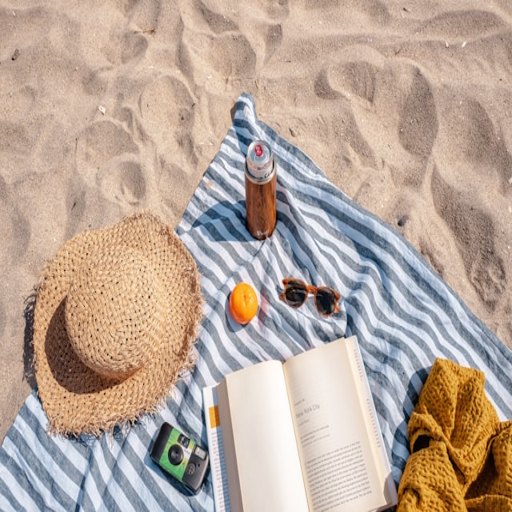

In [33]:
url = "https://unsplash.com/photos/oj0zeY2Ltk4/download?ixid=MnwxMjA3fDB8MXxzZWFyY2h8MTR8fHBpY25pY3xlbnwwfHx8fDE2Nzc0OTE1NDk&force=true&w=640"
im = Image.open(requests.get(url, stream=True).raw).resize((512, 512))
im

Let's change the confidence threshold to 0.25, to get more detections and hopefully catch the camera

In [34]:
text_queries = ["hat", "book", "sunglasses", "camera"]
inputs = processor(text=text_queries, images=im, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)
    target_sizes = torch.tensor([im.size[::-1]])
    results = processor.post_process_object_detection(outputs, threshold=0.25, target_sizes=target_sizes)[0]

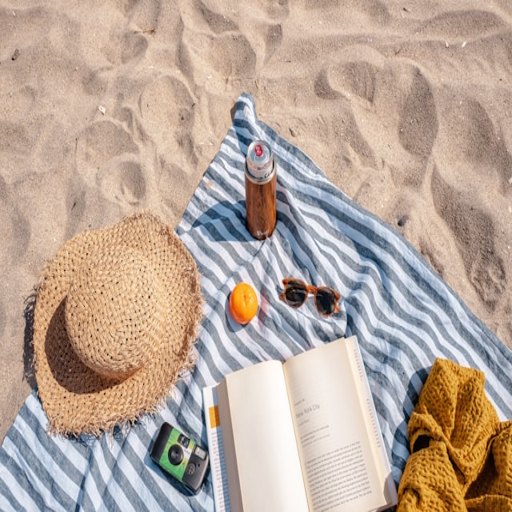

In [35]:
draw = ImageDraw.Draw(im)

scores = results["scores"].tolist()
labels = results["labels"].tolist()
boxes = results["boxes"].tolist()

for box, score, label in zip(boxes, scores, labels):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="magenta", width=3)
    draw.text((xmin, ymin), f"{text_queries[label]}: {round(score,2)}", fill="white")

im

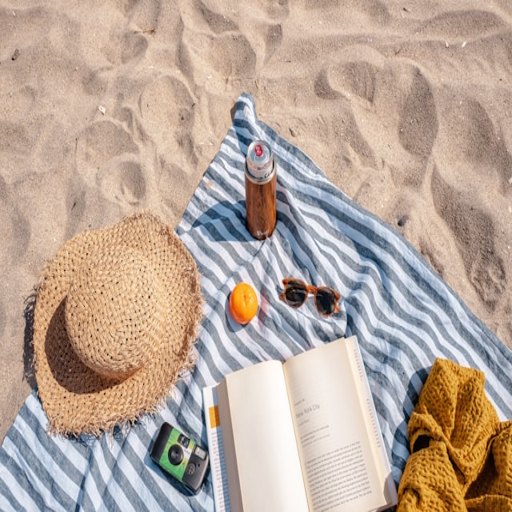

In [38]:
im

Bash shortcuts
Check this.

In [41]:
import transformers

transformers.__version__

'4.38.1'

### Batch processing

You can pass multiple sets of images and text queries to search for different (or same) objects in several images. Let’s use both an astronaut image and the beach image together. For batch processing, you should pass text queries as a nested list to the processor and images as lists of PIL images, PyTorch tensors, or NumPy arrays.

In [ ]:
images = [image, im]
text_queries = [
    ["human face", "rocket", "nasa badge", "star-spangled banner"],
    ["hat", "book", "sunglasses", "camera"],
]
inputs = processor(text=text_queries, images=images, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)
    target_sizes = [x.size[::-1] for x in images]
    results = processor.post_process_object_detection(outputs, threshold=0.25, target_sizes=target_sizes)

Now results is a list of length 2, with each element containing the predictions for the corresponding image.

In [ ]:
results

### Image-guided object detection

In addition to zero-shot object detection with text queries, OWL-ViT offers image-guided object detection. This means you can use an image query to find similar objects in the target image. Unlike text queries, only a single example image is allowed.

Let’s take an image with two cats on a couch, and two remote controllers, as a target image, and an image of a remote controller as a query:

In [ ]:
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image_target = Image.open(requests.get(url, stream=True).raw).resize((512, 512))

#query_url = "http://images.cocodataset.org/val2017/000000524280.jpg"
query_url = "https://i.guim.co.uk/img/media/8459da1aab3ef116fd75f344ce9650e8e32a365f/693_897_4699_2819/master/4699.jpg?width=1200&height=900&quality=85&auto=format&fit=crop&s=ab3cccacc75e2cd047d8ca9b9d65be67"
query_image = Image.open(requests.get(query_url, stream=True).raw).resize((100, 100))

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(20, 15))
ax[0].imshow(image_target)
ax[1].imshow(query_image)

# write titles
ax[0].set_title('Target Image')
ax[1].set_title('Query Image')

We are going to use the newer version of OWL, OWLv2, as it works better with this use case:

In [ ]:
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
import torch

model = AutoModelForZeroShotObjectDetection.from_pretrained("google/owlv2-base-patch16")
processor = AutoProcessor.from_pretrained("google/owlv2-base-patch16")

In the preprocessing step, instead of text queries, you now need to use query_images:

In [ ]:
import torch

inputs = processor(images=image_target, query_images=query_image, return_tensors="pt")

with torch.no_grad():
    outputs = model.image_guided_detection(**inputs)
    target_sizes = torch.tensor([image_target.size[::-1]])
    results = processor.post_process_image_guided_detection(outputs=outputs, target_sizes=target_sizes, threshold=0.9)[0]

For predictions, instead of passing the inputs to the model, pass them to `image_guided_detection()`. Draw the predictions as before except now there are no labels.

In [ ]:
image_to_draw = image_target.copy()

draw = ImageDraw.Draw(image_to_draw)

scores = results["scores"].tolist()
boxes = results["boxes"].tolist()

for box, score in zip(boxes, scores):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="white", width=4)

image_to_draw

In [ ]:
image_target

**Exercise**: Pick a few photos displaying several products of popular consumer brands, such as KitKat, Pringles, Coca-Cola, etc. 

Test the model to see if it can detect the corresponding object in the images.

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


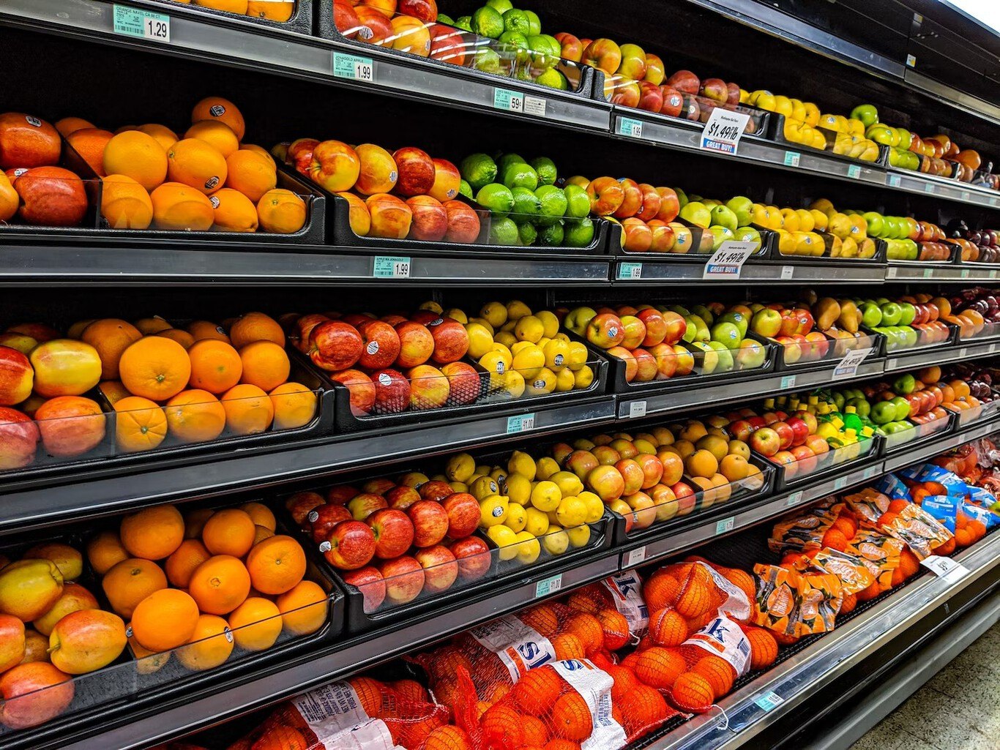

In [13]:
from transformers import pipeline

model_name = "google/owlvit-large-patch14"

detector = pipeline(model=model_name, task="zero-shot-object-detection")

from PIL import Image

image = Image.open('images/supermarket2.jpeg')

image

In [16]:
predictions = detector(
    image,
    candidate_labels=["orange fruit"],
)
predictions

[{'score': 0.2248387336730957,
  'label': 'orange fruit',
  'box': {'xmin': 335, 'ymin': 737, 'xmax': 416, 'ymax': 814}},
 {'score': 0.20191901922225952,
  'label': 'orange fruit',
  'box': {'xmin': 160, 'ymin': 463, 'xmax': 263, 'ymax': 547}},
 {'score': 0.14493323862552643,
  'label': 'orange fruit',
  'box': {'xmin': 178, 'ymin': 809, 'xmax': 285, 'ymax': 889}},
 {'score': 0.14432859420776367,
  'label': 'a lemon',
  'box': {'xmin': 352, 'ymin': 256, 'xmax': 418, 'ymax': 320}},
 {'score': 0.1417725682258606,
  'label': 'orange fruit',
  'box': {'xmin': 168, 'ymin': 702, 'xmax': 251, 'ymax': 765}},
 {'score': 0.13738302886486053,
  'label': 'orange fruit',
  'box': {'xmin': 305, 'ymin': 202, 'xmax': 380, 'ymax': 274}},
 {'score': 0.13653160631656647,
  'label': 'orange fruit',
  'box': {'xmin': 259, 'ymin': 467, 'xmax': 328, 'ymax': 536}},
 {'score': 0.1351265162229538,
  'label': 'orange fruit',
  'box': {'xmin': 333, 'ymin': 735, 'xmax': 419, 'ymax': 812}},
 {'score': 0.13481456041

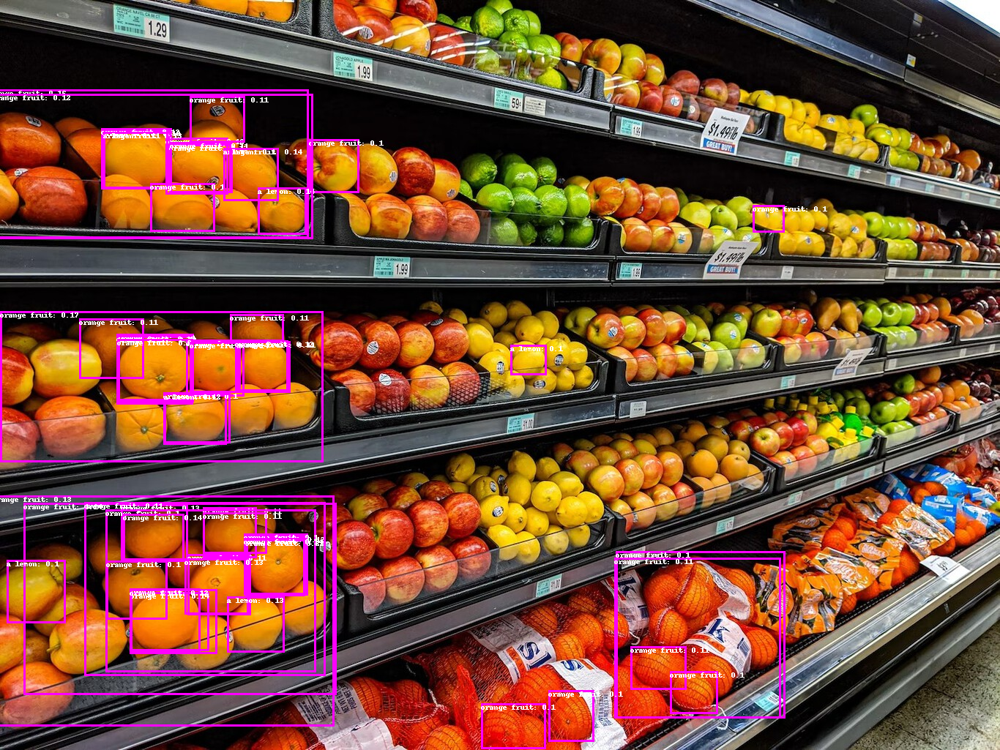

In [18]:
build_image_with_predictions(image, predictions)